In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from google.colab import drive

drive.mount("/content/drive")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
import os
import sys

google_drive_path = "CV/Project_SR"
google_drive_path = os.path.join("drive", "My Drive", "CV/Project_SR")
print(os.listdir(google_drive_path))

#add to sys so we can import python files
sys.path.append(google_drive_path)

['ground_truth', '__pycache__', 'SRCNN_4Xfactor.ipynb', 'srcnn_model.py', 'img_matrix.py', 'prepare_data.py', 'img_resize.py', 'LR_Images', 'srcnn_model.h5', 'Set14', 'Set5', '.ipynb_checkpoints']


In [6]:
import os
import time

os.environ["TZ"] = "US/Eastern"
time.tzset()

from img_matrix import img_matrix
from img_resize import img_resize

img_matrix_path = os.path.join(google_drive_path, "img_matrix.py")
img_matrix_edit_time = time.ctime(
    os.path.getmtime(img_matrix_path)
)

img_resize_path = os.path.join(google_drive_path, "img_resize.py")
img_resize_edit_time = time.ctime(
    os.path.getmtime(img_resize_path)
)


print("img_matrix.py last edited on %s" % img_matrix_edit_time)

print("img_resize.py last edited on %s" % img_resize_edit_time)

img_matrix.py last edited on Thu Mar 21 04:35:26 2024
img_resize.py last edited on Thu Mar 21 04:35:30 2024


In [7]:
# Importing libraries
import sys
import keras
import cv2
import numpy
import matplotlib
import skimage
import os
import time
import matplotlib.pyplot as plt
import cv2
import numpy as np
import math
import os

from keras.models import Sequential
from keras.layers import Conv2D
from keras.optimizers import Adam
from skimage.metrics import structural_similarity as ssim
from matplotlib import pyplot as plt

#python magic fuction
%matplotlib inline

In [8]:
# for plotting set default size of plots
plt.rcParams["figure.figsize"] = (10.0, 8.0)
plt.rcParams["font.size"] = 16
plt.rcParams["image.interpolation"] = "nearest"
plt.rcParams["image.cmap"] = "gray"


In [9]:
#find the version of python and all above imported libraries

# Get Python version
python_version = sys.version

# Get Keras version
keras_version = keras.__version__

# Get OpenCV version
cv2_version = cv2.__version__

# Get NumPy version
numpy_version = np.__version__

# Get Matplotlib version
matplotlib_version = matplotlib.__version__

# Get Scikit-image version
skimage_version = skimage.__version__

# Print the versions
print("Python version:", python_version)
print("Keras version:", keras_version)
print("OpenCV version:", cv2_version)
print("NumPy version:", numpy_version)
print("Matplotlib version:", matplotlib_version)
print("Scikit-image version:", skimage_version)


Python version: 3.10.12 (main, Nov 20 2023, 15:14:05) [GCC 11.4.0]
Keras version: 2.15.0
OpenCV version: 4.8.0
NumPy version: 1.25.2
Matplotlib version: 3.7.1
Scikit-image version: 0.19.3


In [10]:
from img_matrix import img_matrix_fun
from img_resize import img_resize_fun
img_matrix_fun();
img_resize_fun();

Hello from img_matrix.py!
Hello from img_resize.py!


In [11]:
#Image Resizer Converting HR to LR, and will use this HR and LR to train the model

resizer = img_resize()
img_path = os.path.join("drive", "My Drive", "CV/Project_SR/ground_truth")
images, filenames = resizer.prepare_images(img_path, 4)
save_dir = '/content/drive/My Drive/CV/Project_SR/LR_Images'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
for img, filename in zip(images, filenames):
    print('Saving {}'.format(filename))
    cv2.imwrite(os.path.join(save_dir, filename), img)


Saving tt5.bmp
Saving tt14.bmp
Saving tt21.bmp
Saving tt27.bmp
Saving tt15.bmp
Saving tt6.bmp
Saving tt3.bmp
Saving t5.bmp
Saving tt18.bmp
Saving t50.bmp
Saving t46.bmp
Saving tt13.bmp
Saving tt24.bmp
Saving tt10.bmp
Saving t8.bmp
Saving t56.bmp
Saving tt16.bmp
Saving t49.bmp
Saving t7.bmp
Saving t52.bmp
Saving tt9.bmp
Saving t65.bmp
Saving tt7.bmp
Saving tt25.bmp
Saving tt2.bmp
Saving t51.bmp
Saving tt23.bmp
Saving tt22.bmp
Saving t9.bmp
Saving t54.bmp
Saving tt20.bmp
Saving tt12.bmp
Saving tt17.bmp
Saving t57.bmp
Saving tt19.bmp
Saving t55.bmp
Saving t42.bmp
Saving t60.bmp
Saving t4.bmp
Saving t37.bmp
Saving t30.bmp
Saving t61.bmp
Saving tt26.bmp
Saving t36.bmp
Saving t6.bmp
Saving t27.bmp
Saving t47.bmp
Saving t29.bmp
Saving tt1.bmp
Saving tt4.bmp
Saving t53.bmp
Saving t16.bmp
Saving t45.bmp
Saving t17.bmp
Saving t48.bmp
Saving t38.bmp
Saving t44.bmp
Saving t19.bmp
Saving t15.bmp
Saving tt8.bmp
Saving t62.bmp
Saving t20.bmp
Saving t63.bmp
Saving t25.bmp
Saving t18.bmp
Saving t59.bmp

In [12]:
# Test set of HR and LR
#HR will act as a reference or Target and LR will act as a prediction image
resizer = img_resize()
img_path = os.path.join("drive", "My Drive", "CV/Project_SR/Set5")
images, filenames = resizer.prepare_images(img_path, 2)
save_dir = '/content/drive/My Drive/CV/Project_SR/Set5_LR_Images_Test'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
for img, filename in zip(images, filenames):
    print('Saving {}'.format(filename))
    cv2.imwrite(os.path.join(save_dir, filename), img)



Saving woman_GT.bmp
Saving bird_GT.bmp
Saving head_GT.bmp
Saving butterfly_GT.bmp
Saving baby_GT.bmp


In [13]:
# Test set of HR and LR
#HR will act as a reference or Target and LR will act as a prediction image
resizer = img_resize()
img_path = os.path.join("drive", "My Drive", "CV/Project_SR/Set14")
images, filenames = resizer.prepare_images(img_path, 2)
save_dir = '/content/drive/My Drive/CV/Project_SR/Set14_LR_Images_Test'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)
for img, filename in zip(images, filenames):
    print('Saving {}'.format(filename))
    cv2.imwrite(os.path.join(save_dir, filename), img)

Saving flowers.bmp
Saving face.bmp
Saving monarch.bmp
Saving bridge.bmp
Saving comic.bmp
Saving baboon.bmp
Saving coastguard.bmp
Saving barbara.bmp
Saving lenna.bmp
Saving zebra.bmp
Saving pepper.bmp
Saving man.bmp
Saving ppt3.bmp
Saving foreman.bmp


In [14]:
#Calculating the scores of HR and LR images from the trainng dataset in order to find the differences in both

from img_matrix import img_matrix
import os

# Specify the directories in your Google Drive
lr_dir = '/content/drive/My Drive/CV/Project_SR/LR_Images'
gt_dir = '/content/drive/My Drive/CV/Project_SR/ground_truth'

for file in os.listdir(lr_dir):

  # Open target and reference images
  target_path = os.path.join(lr_dir, file)
  ref_path = os.path.join(gt_dir, file)

  if not os.path.exists(target_path) or not os.path.exists(ref_path):
    print(f"Either target image {target_path} or reference image {ref_path} does not exist.")
    continue

  target = cv2.imread(target_path)
  ref = cv2.imread(ref_path)

  if target is None or ref is None:
    print(f"Failed to load target image {target_path} or reference image {ref_path}.")
    continue

  # Calculate scores
  compare = img_matrix() #img_matrix is class from the img_matrix.py file
  scores = compare.compare_images(target, ref)

  # Print all scores
  print('{}\nPSNR: {}\nMSE: {}\nSSIM: {}\n'.format(file, scores[0], scores[1], scores[2]))


/content/drive/My Drive/CV/Project_SR/img_matrix.py:60: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  scores.append(ssim(target,ref,multichannel = True))#multichannel -> rgb


tt5.bmp
PSNR: 25.246726408312725
MSE: 582.8126569192143
SSIM: 0.7995182495268547

tt14.bmp
PSNR: 23.1665688697288
MSE: 940.9027299749687
SSIM: 0.6382953818501457

tt21.bmp
PSNR: 22.960461492796377
MSE: 986.6326116426495
SSIM: 0.7480297482932787

tt27.bmp
PSNR: 29.244565589141125
MSE: 232.13736833199374
SSIM: 0.8563557242842356

tt15.bmp
PSNR: 19.686175938864075
MSE: 2096.9304281345567
SSIM: 0.5472362657095918

tt6.bmp
PSNR: 19.881772647840936
MSE: 2004.5844208559263
SSIM: 0.6682240160271462

tt3.bmp
PSNR: 27.587047429611452
MSE: 340.0140573391465
SSIM: 0.7804891062700589

t5.bmp
PSNR: 30.013346271442273
MSE: 194.4764366588336
SSIM: 0.7525741015571193

tt18.bmp
PSNR: 21.20564679205136
MSE: 1477.872392638037
SSIM: 0.7144253365157643

t50.bmp
PSNR: 21.87486062829531
MSE: 1266.8218713856118
SSIM: 0.6846292572264203

t46.bmp
PSNR: 25.387079782656453
MSE: 564.2786742590653
SSIM: 0.7462872806818153

tt13.bmp
PSNR: 19.166787165931176
MSE: 2363.322006472492
SSIM: 0.5494524323087205

tt24.bmp
PS

In [15]:
#Preprocessing the input data/trainng data to make it of all same size
# Here it will generate train.h5 file in order to feed into model.

import os
import cv2
import h5py
import numpy
from prepare_data import prepare_data
lr_dir = '/content/drive/My Drive/CV/Project_SR/LR_Images'
gt_dir = '/content/drive/My Drive/CV/Project_SR/ground_truth'

data, label = prepare_data(lr_dir, gt_dir)#this will create train.h5 file

with h5py.File('train.h5', 'w') as f:
    f.create_dataset('data', data=data)
    f.create_dataset('label', data=label)

In [16]:
with h5py.File('train.h5', 'r') as f:
    print(f.keys())


<KeysViewHDF5 ['data', 'label']>


Data shape: (107, 32, 32)
Label shape: (107, 20, 20)


Data train shape: (85, 32, 32)
Label train shape: (85, 20, 20)
Data val shape: (22, 32, 32)
Label val shape: (22, 20, 20)

Epoch 1: val_loss improved from inf to 0.05013, saving model to SRCNN_check.h5

Epoch 2: val_loss did not improve from 0.05013

Epoch 3: val_loss improved from 0.05013 to 0.04561, saving model to SRCNN_check.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 4: val_loss improved from 0.04561 to 0.02661, saving model to SRCNN_check.h5

Epoch 5: val_loss did not improve from 0.02661

Epoch 6: val_loss did not improve from 0.02661

Epoch 7: val_loss did not improve from 0.02661

Epoch 8: val_loss did not improve from 0.02661

Epoch 9: val_loss improved from 0.02661 to 0.02606, saving model to SRCNN_check.h5

Epoch 10: val_loss did not improve from 0.02606

Epoch 11: val_loss did not improve from 0.02606

Epoch 12: val_loss did not improve from 0.02606

Epoch 13: val_loss did not improve from 0.02606

Epoch 14: val_loss improved from 0.02606 to 0.02471, saving model to SRCNN_check.h5

Epoch 15: val_loss did not improve from 0.02471

Epoch 16: val_loss did not improve from 0.02471

Epoch 17: val_loss did not improve from 0.02471

Epoch 18: val_loss did not improve from 0.02471

Epoch 19: val_loss did not improve from 0.02471

Epoch 20: val_loss did not improve from 0.02471

Epoch 21: val_loss did not improve from 0.02471

Epoch 22: val_l

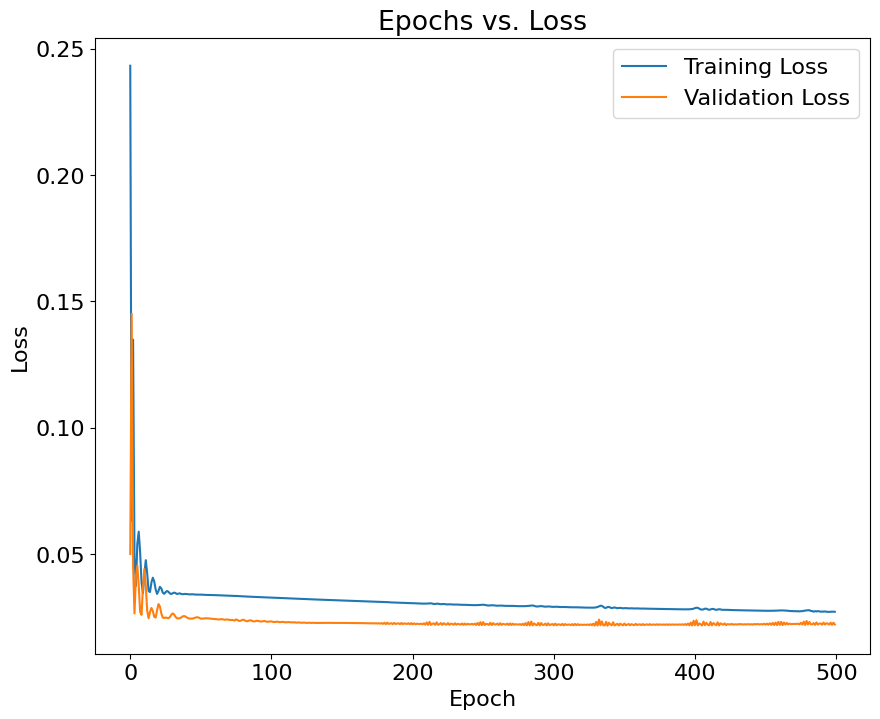

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 24, 24, 128)       10496     
                                                                 
 conv2d_1 (Conv2D)           (None, 24, 24, 64)        73792     
                                                                 
 conv2d_2 (Conv2D)           (None, 20, 20, 1)         1601      
                                                                 
Total params: 85889 (335.50 KB)
Trainable params: 85889 (335.50 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
None


'/content/drive/My Drive/CV/Project_SR/srcnn_model.h5'

In [17]:
#Training the model and saving it into both drive and in colab
# data is the low resolution whereas labels are the HR images


import os
from srcnn_model import train
import h5py
import numpy as np
import shutil

# Load the training data and labels from train.h5
with h5py.File('train.h5', 'r') as f:
    data_train = f['data'][:]
    label_train = f['label'][:]

# Print the shape of the data and labels
print('Data shape:', data_train.shape)
print('Label shape:', label_train.shape)

srcnn_model_trained = train(data_train, label_train)#taking data  and label from train.h5 file
#Further split into Train Validation during training the model
print(srcnn_model_trained.summary())

drive_path = "/content/drive/My Drive/CV/Project_SR"

# Copy the saved model file to the desired location in your Google Drive
src_file = '/content/srcnn_model.h5'
dst_file = os.path.join(drive_path, 'srcnn_model.h5')
shutil.copyfile(src_file, dst_file)

In [18]:
# Load the images
degraded = cv2.imread('/content/drive/My Drive/CV/Project_SR/LR_Images/flowers.bmp')
ref = cv2.imread('/content/drive/My Drive/CV/Project_SR/ground_truth/{}'.format(file))



Test on Set 5 Data set
Predicting for baby_GT.bmp
1/1 [==============================] - 0s 57ms/step
Bicubic:
Degraded Image:
PSNR: 34.2527045770483
MSE: 73.27083787867768
SSIM: 0.9344362511483775

Bilinear:
Reconstructed Image:
PSNR: 24.556770178341438
MSE: 683.1634101799552
SSIM: 0.6540653783221732



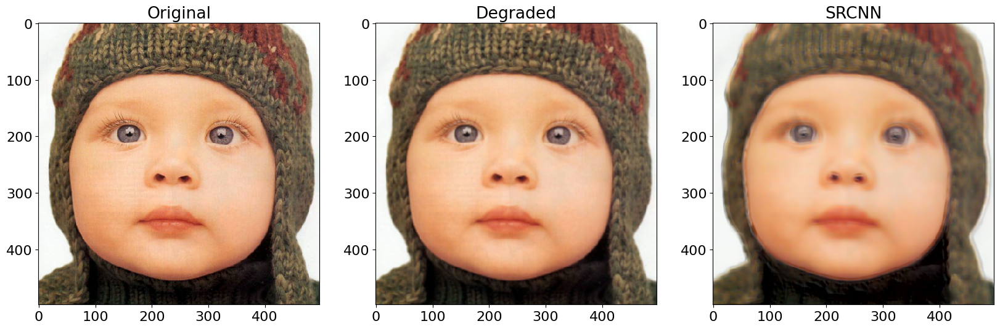

Predicting for bird_GT.bmp
1/1 [==============================] - 0s 84ms/step
Bicubic:
Degraded Image:
PSNR: 32.9717779215716
MSE: 98.40650856389986
SSIM: 0.9532838164378017

Bilinear:
Reconstructed Image:
PSNR: 22.506709727924147
MSE: 1095.293833992095
SSIM: 0.6004983465044934



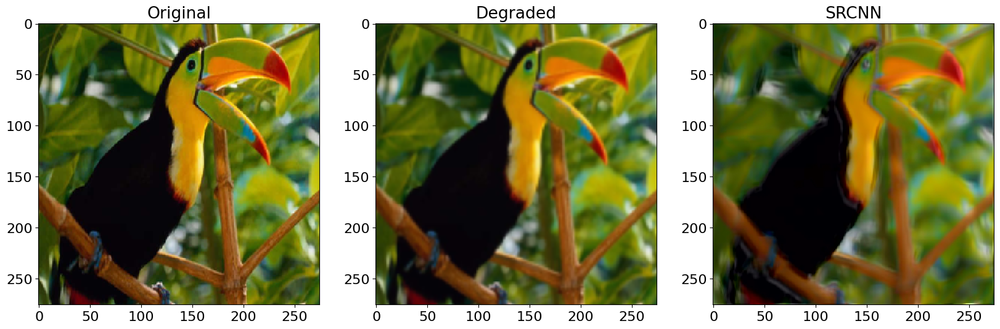

Predicting for butterfly_GT.bmp
1/1 [==============================] - 0s 51ms/step
Bicubic:
Degraded Image:
PSNR: 24.752462626436284
MSE: 653.0634118967453
SSIM: 0.8788410517538944

Bilinear:
Reconstructed Image:
PSNR: 16.42200436543706
MSE: 4446.324745774241
SSIM: 0.46423014720048766



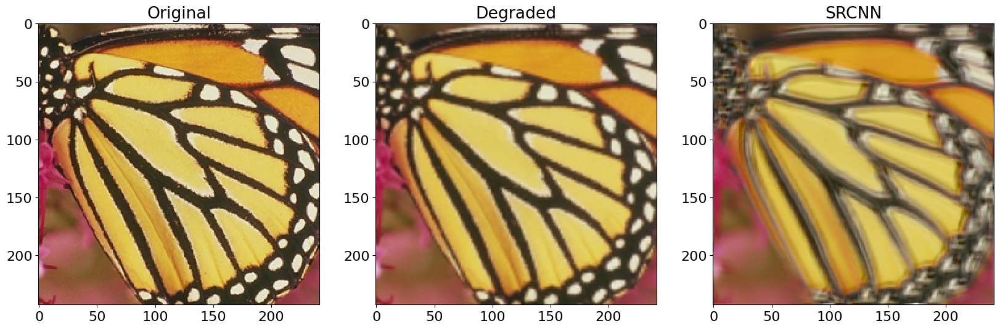

Predicting for head_GT.bmp
1/1 [==============================] - 0s 52ms/step
Bicubic:
Degraded Image:
PSNR: 30.914629910015442
MSE: 158.0296668637887
SSIM: 0.8008776169731272

Bilinear:
Reconstructed Image:
PSNR: 25.44949999985984
MSE: 556.2264227985695
SSIM: 0.45809124067423884



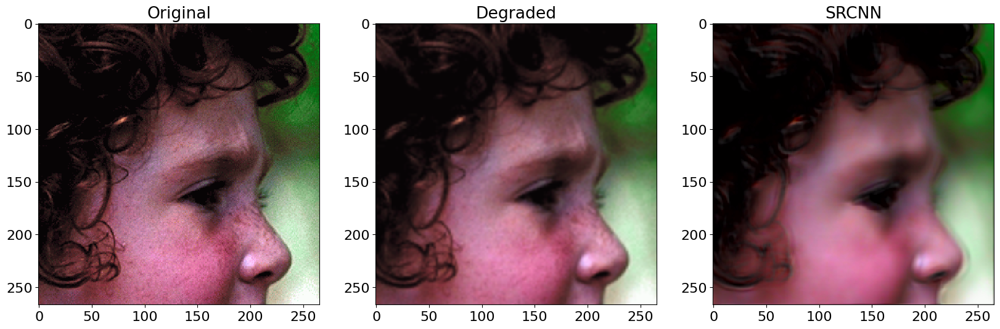

Predicting for woman_GT.bmp
1/1 [==============================] - 0s 100ms/step
Bicubic:
Degraded Image:
PSNR: 29.382492859150435
MSE: 224.88077519379846
SSIM: 0.9337021621145872

Bilinear:
Reconstructed Image:
PSNR: 19.50477506630744
MSE: 2186.3722621564484
SSIM: 0.5530665294981212



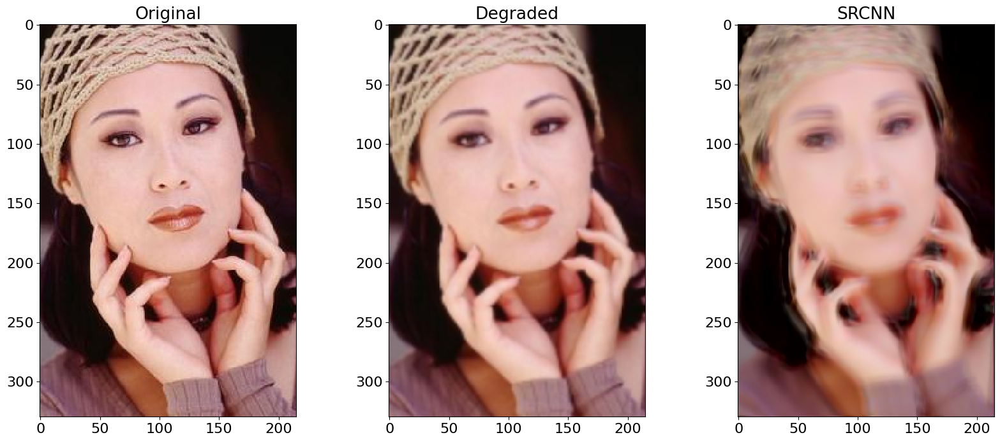

In [20]:
from srcnn_model import predict5
from img_matrix import img_matrix
import matplotlib.pyplot as plt
import cv2

# List of your image filenames
image_filenames = ['baby_GT.bmp', 'bird_GT.bmp', 'butterfly_GT.bmp', 'head_GT.bmp', 'woman_GT.bmp']

print("Test on Set 5 Data set")

compare = img_matrix()

for filename in image_filenames:
    img_path = os.path.join('/content/drive/My Drive/CV/Project_SR/Set5_LR_Images_Test', filename)
    print(f"Predicting for {filename}")
    ref, degraded, output = predict5(img_path, '/content/srcnn_model.h5')

    # Calculate image quality scores
    scores = []
    scores.append(compare.compare_images(degraded, ref))
    scores.append(compare.compare_images(output, ref))
    print("Bicubic:")
    print('Degraded Image:\nPSNR: {}\nMSE: {}\nSSIM: {}\n'.format(scores[0][0], scores[0][1], scores[0][2]))
    print("Bilinear:")
    print('Reconstructed Image:\nPSNR: {}\nMSE: {}\nSSIM: {}\n'.format(scores[1][0], scores[1][1], scores[1][2]))

    # Display images
    fig, axs = plt.subplots(1,3, figsize= (20,8))
    axs[0].imshow(cv2.cvtColor(ref, cv2.COLOR_BGR2RGB))
    axs[0].set_title('Original')
    axs[1].imshow(cv2.cvtColor(degraded, cv2.COLOR_BGR2RGB))
    axs[1].set_title('Degraded')
    axs[2].imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
    axs[2].set_title('SRCNN')
    plt.show()

Test on Set 14 Data set
Predicting for barbara.bmp
1/1 [==============================] - 1s 1s/step
Bicubic:
Degraded Image:
PSNR: 25.888852808173493
MSE: 502.7086229899586
SSIM: 0.8086912237988951

Bilinear:
Reconstructed Image:
PSNR: 21.25508784184654
MSE: 1461.1433687441693
SSIM: 0.5310442862825742



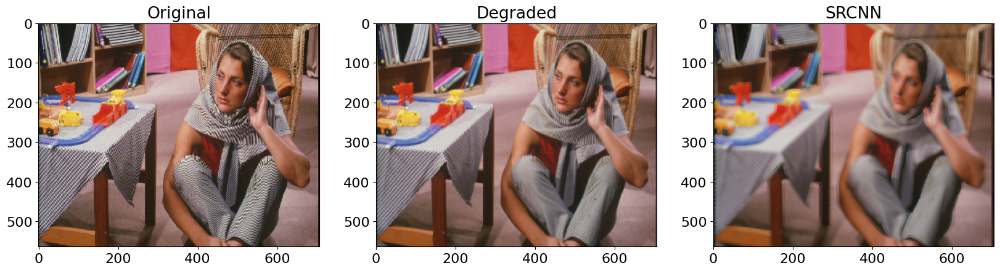

Predicting for coastguard.bmp
1/1 [==============================] - 0s 388ms/step
Bicubic:
Degraded Image:
PSNR: 27.368831974620207
MSE: 357.53488122802503
SSIM: 0.7527808342151686

Bilinear:
Reconstructed Image:
PSNR: 21.662853846466128
MSE: 1330.1978175113627
SSIM: 0.3521159190241294



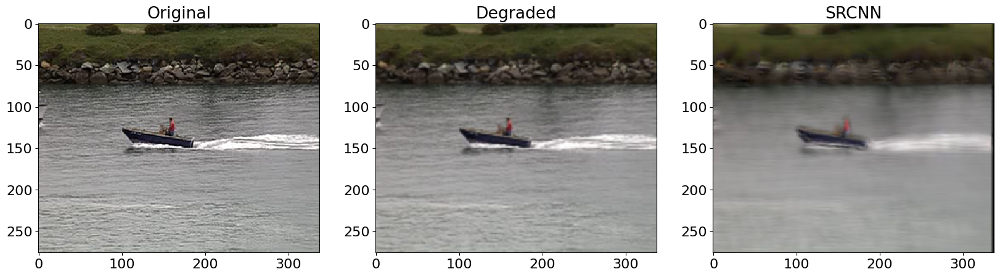

Predicting for comic.bmp
1/1 [==============================] - 0s 320ms/step
Bicubic:
Degraded Image:
PSNR: 23.635798521218998
MSE: 844.5429938632378
SSIM: 0.8295735523314516

Bilinear:
Reconstructed Image:
PSNR: 17.45950955392731
MSE: 3501.4720192869668
SSIM: 0.3598674456022017



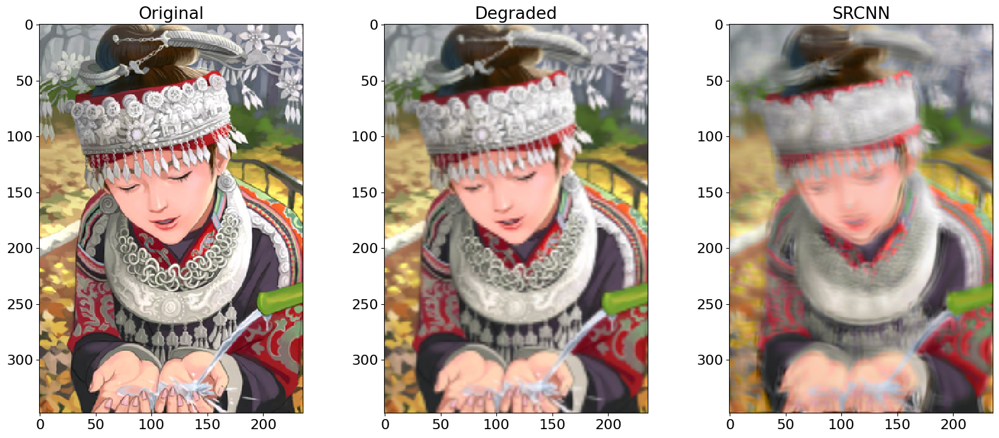

Predicting for lenna.bmp
1/1 [==============================] - 0s 78ms/step
Bicubic:
Degraded Image:
PSNR: 31.35857283101428
MSE: 142.6738341696767
SSIM: 0.8459403992986435

Bilinear:
Reconstructed Image:
PSNR: 23.568258482522815
MSE: 857.7797063505532
SSIM: 0.6050672922566296



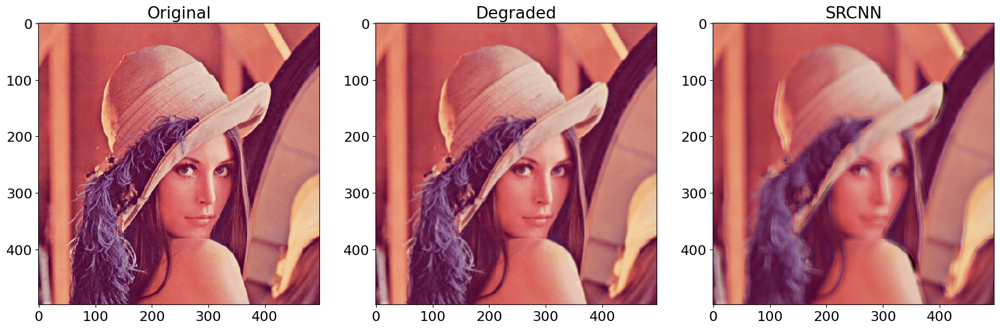

Predicting for flowers.bmp
1/1 [==============================] - 1s 705ms/step
Bicubic:
Degraded Image:
PSNR: 27.248686459559124
MSE: 367.56400047398984
SSIM: 0.8690622024599293

Bilinear:
Reconstructed Image:
PSNR: 20.225428814429254
MSE: 1852.075702097405
SSIM: 0.5023100419044124



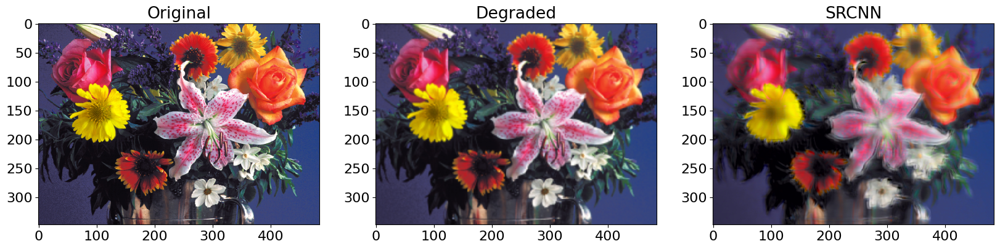

In [21]:
from srcnn_model import predict5, predict14
from img_matrix import img_matrix
import matplotlib.pyplot as plt
import cv2


# List of your image filenames
image_filenames = ['barbara.bmp', 'coastguard.bmp', 'comic.bmp', 'lenna.bmp', 'flowers.bmp']


print("Test on Set 14 Data set")


compare = img_matrix()


for filename in image_filenames:
    img_path = os.path.join('/content/drive/My Drive/CV/Project_SR/Set14_LR_Images_Test', filename)
    print(f"Predicting for {filename}")
    ref, degraded, output = predict14(img_path, '/content/srcnn_model.h5')


    # Calculate image quality scores
    scores = []
    scores.append(compare.compare_images(degraded, ref))
    scores.append(compare.compare_images(output, ref))
    print("Bicubic:")
    print('Degraded Image:\nPSNR: {}\nMSE: {}\nSSIM: {}\n'.format(scores[0][0], scores[0][1], scores[0][2]))
    print("Bilinear:")
    print('Reconstructed Image:\nPSNR: {}\nMSE: {}\nSSIM: {}\n'.format(scores[1][0], scores[1][1], scores[1][2]))


    # Display images
    fig, axs = plt.subplots(1,3, figsize= (20,8))
    axs[0].imshow(cv2.cvtColor(ref, cv2.COLOR_BGR2RGB))
    axs[0].set_title('Original')
    axs[1].imshow(cv2.cvtColor(degraded, cv2.COLOR_BGR2RGB))
    axs[1].set_title('Degraded')
    axs[2].imshow(cv2.cvtColor(output, cv2.COLOR_BGR2RGB))
    axs[2].set_title('SRCNN')
    plt.show()

Degraded Image:
PSNR: 27.248686459559124
MSE: 367.56400047398984
SSIM: 0.8690622024599293

Reconstructed Image:
PSNR: 20.225428814429254
MSE: 1852.075702097405
SSIM: 0.5023100419044124



Text(0.5, 1.0, 'SRCNN')

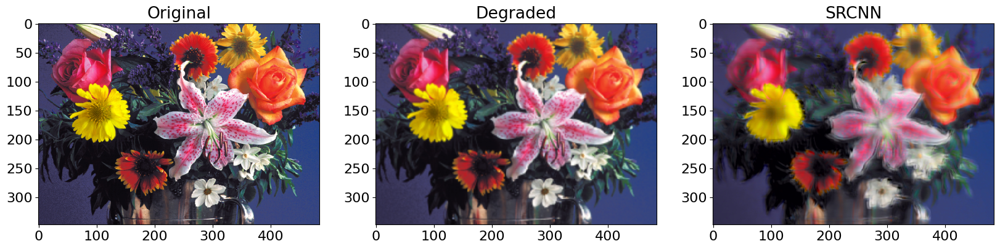

In [22]:
from img_matrix import img_matrix

compare = img_matrix()
#print the scores for all images
#image quality calculation
scores= []
scores.append(compare.compare_images(degraded, ref))
scores.append(compare.compare_images(output, ref))
print('Degraded Image:\nPSNR: {}\nMSE: {}\nSSIM: {}\n'.format(scores[0][0], scores[0][1], scores[0][2]))
print('Reconstructed Image:\nPSNR: {}\nMSE: {}\nSSIM: {}\n'.format(scores[1][0], scores[1][1], scores[1][2]))

#display images
fig, axs = plt.subplots(1,3, figsize= (20,8))
axs[0].imshow(cv2.cvtColor(ref,cv2.COLOR_BGR2RGB))
axs[0].set_title('Original')
axs[1].imshow(cv2.cvtColor(degraded,cv2.COLOR_BGR2RGB))
axs[1].set_title('Degraded')
axs[2].imshow(cv2.cvtColor(output,cv2.COLOR_BGR2RGB))
axs[2].set_title('SRCNN')